## Importing required packages

In [2]:
# Immport zpt function. Make sure you have both the zpt.py and this notebook (zpt.ipynb) in the same folder.
from tools import zpt

# Importing a few built-in python and astropy packages
import os
import numpy as np
import pandas as pd
from ccdproc import ImageFileCollection

from astropy import units as u
from astropy.coordinates import SkyCoord

from astropy.stats import sigma_clipped_stats

%matplotlib notebook

## 1 Getting Image File Collection and Filtering Data
---

Before estimating the zero points, we want to get an image colletion of the images stored in our working folder. In the next cell, we will define our working folder. One can put the path to it explicitly or if you prefer, you can move this notebook to your working folder and define the `working_folder` as `working_folder = os.getcwd()`. 

In the cells below, we defined the working folder based on the same directory structure you will find in the 
[Four Star GitLab Repository](http://gitlab.lco.cl/dsanmartim/four_star). In order to do that, we used this command: `working_folder = os.path.join(cwd, "sample")`. 


```
├── bin
└── four_star
    ├── __init__.py
    ├── data
    │   └── FinalData
    ├── tools
    │   └── zpt.py
    ├── zpt_four_star.ipynb
```

If you downloaded the entire repository from gitlab, then we recommend you run this notebook with the sample data set before running it in your data. Below, we are eaxecuting all steps in the sample data set located inside the `data/FinalData` folder.


In [14]:
##### Option 1
# Uncomment and insert the path to your working folder
#working_folder = '/path-to-working-folder/'

##### Option 2
# Comment if you don't want to use this definition
#working_folder = os.path.join(os.getcwd(), 'data/FinalData/')

working_folder = '/Users/dsanmartim/PycharmProjects/four_star/four_star/data/FinalData/'

In [15]:
# You don't need to edit this cell, unleass you are familiar with jupyter notebooks and want to change somethink
keywords = ['object', 'filter', 'crval1', 'crval2', 'date-obs', 'gain', 'airmass', 'scale']


# Note that you can include or exclude keywords (same as the ones in the header images) if you want. Just follow 
# the same syntax
ic = ImageFileCollection(working_folder, glob_include='2019-07*mos.fits', keywords=keywords, ext=0)

# Gonig to data dir
os.chdir(working_folder)

# Displaying the current path location
os.getcwd()

'/Users/dsanmartim/PycharmProjects/four_star/four_star/data/FinalData'

###  Filtering data

Here we will keep in the Image Collection only the files we want to analyze. For example, if we have `bias` and `flat` files in our working folder and we don't want to see them in our Image Collection, just run the cell below.

Let's say we want to exclude from our Image Collection files files which the `object` name is '*target name*'. In this case, we just do the following to exclude such files from the Image Collection data frame:

```python
df = df[df.object != 'target name']
```


In [17]:
# Converting Image Collection to Pandas Data Frame
df = ic.summary.to_pandas()

df

,file,object,filter,crval1,crval2,date-obs,gain,airmass,scale
0,2019-07-17_H_G93-48_c1-4_58681_21902.mos.fits,G93-48,H,328.058945,2.437661,2019-07-17,1.0,1.298,0.16
1,2019-07-17_J_G93-48_c1-4_58681_21612.mos.fits,G93-48,J,328.052441,2.411114,2019-07-17,1.0,1.309,0.16
2,2019-07-17_Ks_G93-48_c1-4_58681_22325.mos.fits,G93-48,Ks,328.059067,2.437267,2019-07-17,1.0,1.282,0.16


## 2 Running DAOStarFinder and Idenfitying Surces

Here, we want to identify the sources in our image. The DAOStarFinder algorithm is very sensive to the `fwhm` of the sources, so if you get an error while running the `zpt.find_stars` method, the main reason may be the lack of target identification. In this case, try to channge the `fwhm` (in pixels) input value. If your images are defocused, the `fwhm` you will give as an input to the `zpt.find_stars` method will not be directly related to the real `fwhm` of the sources, but most probably to the width of the 'donuts'. 

If the star field is crowded and the `zpt.find_stars` method returns too many sources, then you can increase the `threshold` value to something like 10-15, which means the `zpt.find_stars` method will only take stars that are 10-15 times above the standard deviation of the image background. You can also increase the value of the `fwhm` parameter if the `zpt.find_stars` identifies the same star more the once. Note that this can happen a lot (depending on the `fwhm` and `threshold` input values) for stars defocused with a donuts shape. 

In the followign steps you will pass the image data and the full header to the variables `data` and `header`, which will be used along this notebook as an input to the `zpt.find_stars`, `zpt.display`, `zpt.get_aperture_photo` and finally to the `zpg.get_zpt` methods.

Good news. No saturated sources!


<IPython.core.display.Javascript object>


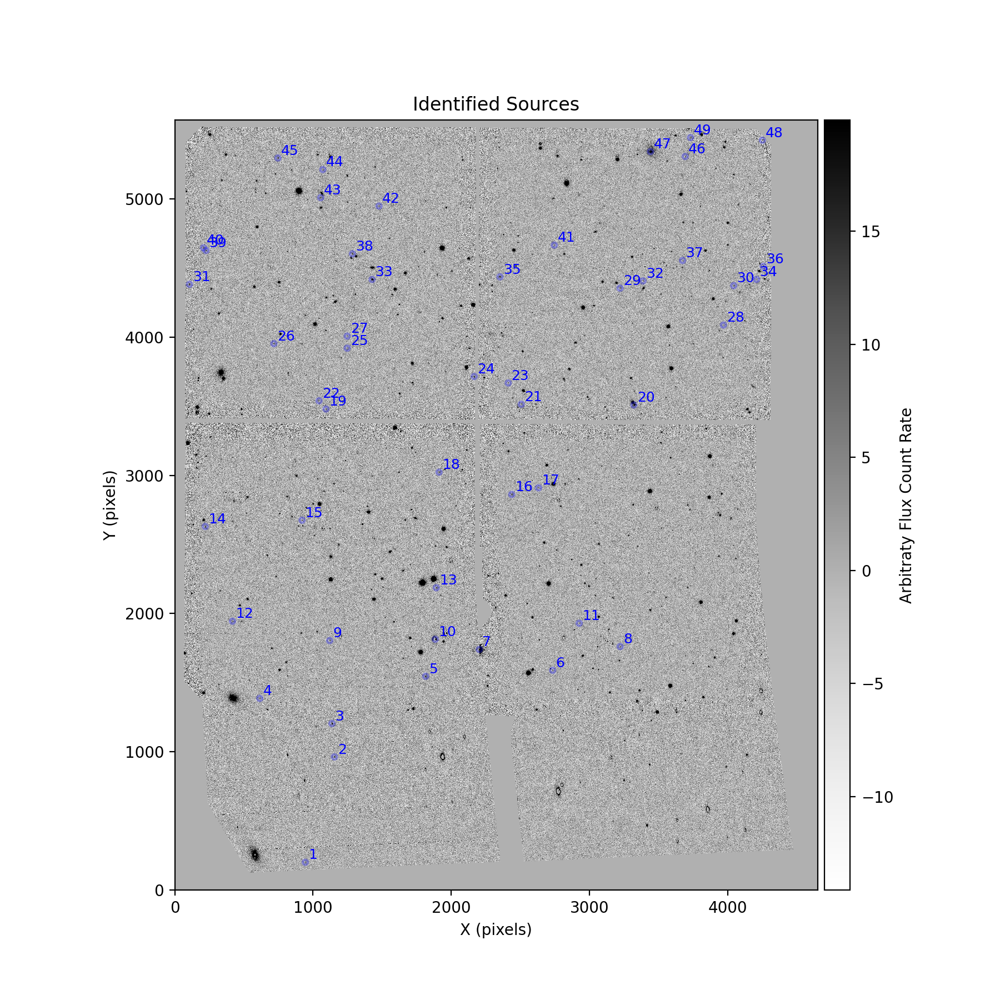

In [18]:
%matplotlib notebook
### 1. Gettting data array and header information from fits image. 

# Input parameter
filename = '2019-07-17_J_G93-48_c1-4_58681_21612.mos.fits'
#filename = '2019-07-17_H_G93-48_c1-4_58681_21902.mos.fits'
#filename = '2019-07-17_Ks_G93-48_c1-4_58681_22325.mos.fits'

# Running get_image()
hdulist = zpt.get_hdulist(filename)

header, data = hdulist[0].header, hdulist[0].data

### 2. Finding Sources in the data array.

# Input parameters
fwhm = 20               # in pixels
threshold = 12.0
saturation = 26641.4   # in ADU's

# Gettin only roundesse sources
round_low = -0.3
round_high = 0.3

# Running find_stars()
_ , sources, bad_stars = zpt.find_stars(data, fwhm=fwhm, threshold=threshold, saturation=saturation, 
                                        round_low=round_low, round_high=round_high, show=True)

### 2.1 Converting (X, Y) to (RA, DEC)
---

This step is not necessary if you want to match the sources with the 2MASS Point Sources Catalog, but in case you want to convert the (x,y) position of the identified sources to (RA, DEC) cordinates, the you can run the ``zpt.sky2world`` method. Note that the ``sky2world`` method requires an hdulist as input, which should contain an accurate World Coordinates System (WCS) inside it. We can run this method as follows:


In [21]:
#radec_sources = zpt.sky2world(hdulist, sources, max_error=1e-6)
#
#radec_sources

## 3. Getting Catalog and Matching Sources
---

In order to estimate the zero points in the whole field, first we want to 1) get reference stars from the 2MASS All Sky Point Sources Catalog and 2) to match stars from catalog with sources found in our image. In order to do that, we have a couple of functions customized for these purpososes.


### 3.1 Getting 2MASS Referencde Stars
---

In order to get the reference stars, we have to provide a couple of information to the query method. 



In [35]:
coordinates = zpt.get_coordinates(hdulist, ra_deg=None, dec_deg=None)

two_mass = zpt.get_two_mass_sources(coordinates, spatial='Cone', radius=8.5 * u.arcmin)

two_mass

/Users/dsanmartim/opt/anaconda3/lib/python3.7/site-packages/astroquery/irsa/core.py:451: UserWarning: Coordinate string is being interpreted as an ICRS coordinate.
  warnings.warn("Coordinate string is being interpreted as an "
/Users/dsanmartim/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: TableReplaceWarning: converted column 'phi_opt' from integer to float
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/dsanmartim/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: TableReplaceWarning: converted column 'ext_key' from integer to float
  This is separate from the ipykernel package so we can avoid doing imports until


,ra,dec,clon,clat,err_maj,err_min,err_ang,designation,j_m,j_cmsig,...,phi_opt,b_m_opt,vr_m_opt,nopt_mchs,ext_key,dist,angle,j_h,h_k,j_k
0,8.224887,-39.419289,b'00h32m53.97s',b'-39d25m09.44s',0.07,0.07,11,b'00325397-3925094',15.412,0.048,...,104.0,19.7,17.7,1,NaN,79.782660,299.278357,0.588,0.214,0.802
1,8.240680,-39.408680,b'00h32m57.76s',b'-39d24m31.25s',0.20,0.19,15,b'00325776-3924312',16.777,0.154,...,NaN,NaN,NaN,0,NaN,81.374680,341.609381,0.606,NaN,NaN
2,8.285771,-39.440468,b'00h33m08.59s',b'-39d26m25.68s',0.28,0.24,63,b'00330858-3926256',16.435,0.136,...,57.0,19.7,17.8,1,NaN,106.428347,110.479670,0.765,0.197,0.962
3,8.212651,-39.441647,b'00h32m51.04s',b'-39d26m29.93s',0.08,0.07,83,b'00325103-3926299',15.384,0.052,...,329.0,17.5,16.6,1,NaN,111.584088,248.175747,0.482,-0.063,0.419
4,8.295379,-39.436607,b'00h33m10.89s',b'-39d26m11.79s',0.09,0.09,86,b'00331089-3926117',15.712,0.066,...,328.0,18.4,17.0,1,NaN,128.559230,100.464195,0.606,-0.008,0.598
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,8.314991,-39.301853,b'00h33m15.60s',b'-39d18m06.67s',0.20,0.19,36,b'00331559-3918066',16.309,0.125,...,338.0,17.7,16.9,1,NaN,496.050255,21.437517,0.575,0.827,1.402
106,8.411352,-39.489815,b'00h33m38.72s',b'-39d29m23.33s',0.07,0.06,90,b'00333872-3929233',14.169,0.028,...,352.0,18.1,16.5,1,NaN,497.510346,115.638366,0.679,0.120,0.799
107,8.093916,-39.360497,b'00h32m22.54s',b'-39d21m37.79s',0.22,0.21,80,b'00322253-3921377',16.361,0.107,...,44.0,19.6,17.6,1,NaN,501.176686,299.962415,0.762,0.321,1.083
108,8.423897,-39.388374,b'00h33m41.74s',b'-39d23m18.15s',0.20,0.19,30,b'00334173-3923181',16.710,0.159,...,63.0,20.5,17.9,1,NaN,506.748801,72.799383,0.840,NaN,NaN


### 3.2 Matching Catalogs
---


## Parei aqui

Outra forma de fazer seria passando as coordenadas do cat. 2mass pra pixel e comparar a diferença deles... como se faz nesse link https://nbviewer.jupyter.org/gist/dokeeffe/416e214f134d39db696c7fdac261964b

In [36]:
catalog = two_mass
sources = sources

#hdulist = zpt.get_hdulist(filename)
#header, data = hdulist[0].header, hdulist[0].data

fr = zpt.match_sources(sources, catalog, hdulist, max_separation = 5*u.arcsec)

5 2MASS Point Sources macth with sources from image.


In [37]:
fr = fr[['id', 'xcentroid', 'ycentroid', 'sharpness', 'roundness1', 'roundness2',
         'npix', 'sky', 'peak', 'flux', 'mag', 'ra', 'dec', 'clon', 'clat',
         'designation', 'j_m', 'j_cmsig', 'j_snr', 'h_m', 'h_cmsig', 'h_snr', 'k_m',
         'k_cmsig', 'k_snr']]

<IPython.core.display.Javascript object>


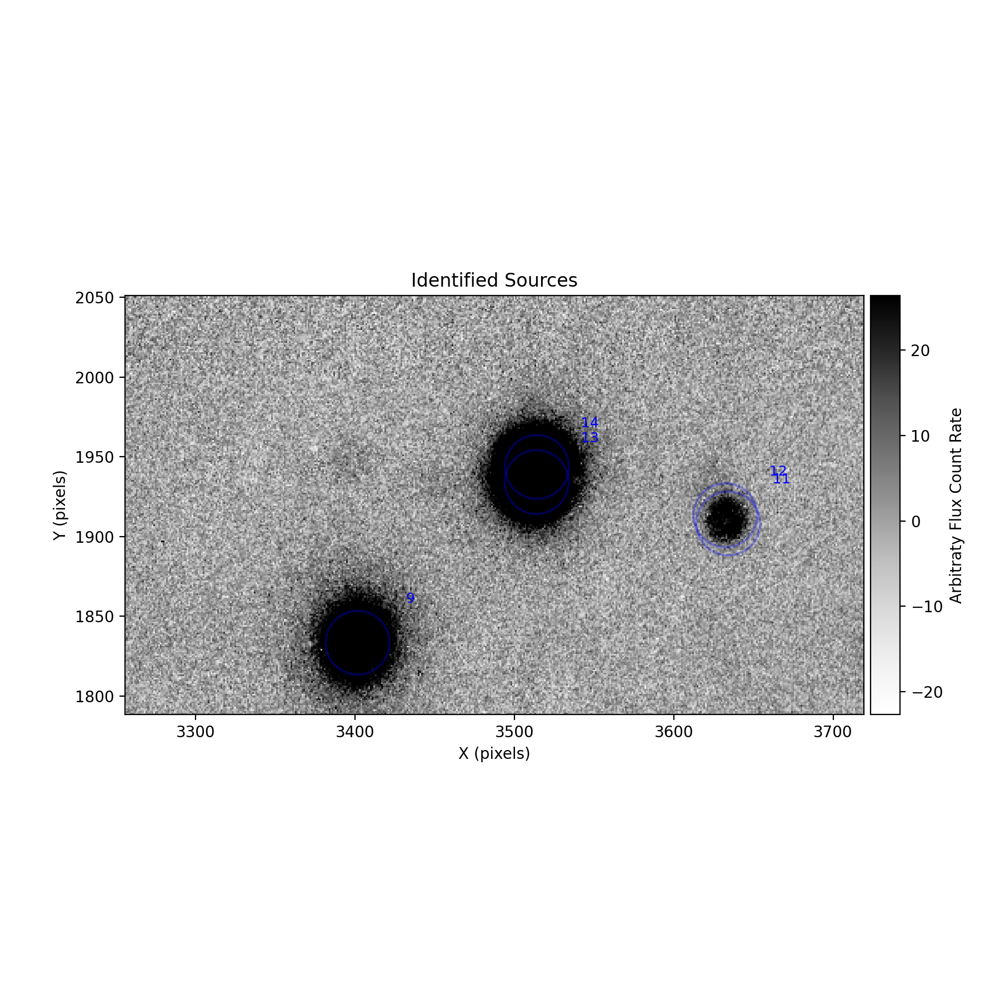

In [38]:
zpt.display(data, fr, saturated=None, radio=20, stretch='linear', percent=99.5, color_map='Greys')

## 4. Getting Aperture Photometry and Estimating Zero Points
---

Here, we want to obtain the aperture photometry of the sources identified by the `zpt.find_stars` method in the cell above. Note that this step is redundant, because the `zpt.find_stars` function will be run again inside the `zpt.get_aperture_photo` method. So, we recommend you to run the `zpt.get_aperture_photo` using the same parameters you used in the `find_stars` method above.

You can skip the step above, but it is particularly useful if the field is crowded, because it is much easier to idenfity the stars of the field when displayed by the `zpt.find_stars` than by the `zpt.get_aperture_photo`. This happens because the `show` option of the `zpt.get_aperture_photo` functions display the apertures plus the annuli, which polutes the image displayed and can make the sources identification a bit hard to be done. 

We also recommend that you run the `zpt.get_aperture_photo` method in order to get used to it, even though this step is redundant with the `zpt.find_stars` method you just run above. 

In [27]:
5 * (1 / 0.16)

31.25

<IPython.core.display.Javascript object>


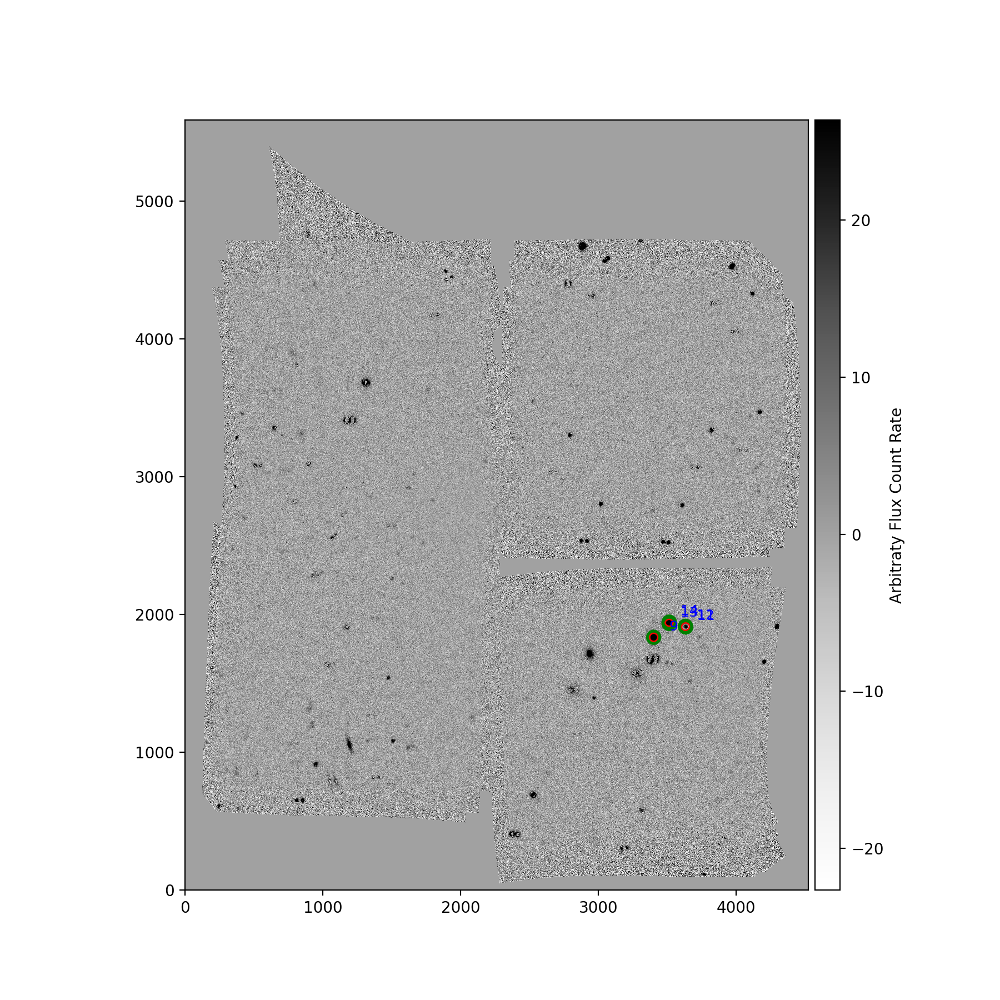

In [39]:
### Getting photometry. 

# Input parameters related to the aperture photometry
aperture = 30.0        # in pixels ()
annulus_width = 10.0   # in pixels

# Running get_aperture_photo()
photo = zpt.get_photo(data, fr, aperture=aperture, annulus_width=annulus_width, show=True, 
                      join_frames=True)


# ToDo

Enfim tenho um data frame que foi obtido fazendo:

> find_stars >> matched with 2mass catalog >> ap_photo

Ou seja, ele contem as fontes identificadas na imagem e que estao no catalogo, incluindo a fotometria de 
abertura. Com isso, preciso agora adicionar uma columa com os zero points pra casa estrela de comparacao.

Provavelmente alguns valores vao estar bastante fora da media... ai tem algumas opcoes pra remover outliers:

- forma da fonte (roundness)
- sigma clipping
- funcao do scikit learning pra remover outliers?


Nota: lembrar de obter tambem uma coluna com o raio de cada estrela com relacao ao centro da imagem



## 4 Estimating Zero Points 

<IPython.core.display.Javascript object>


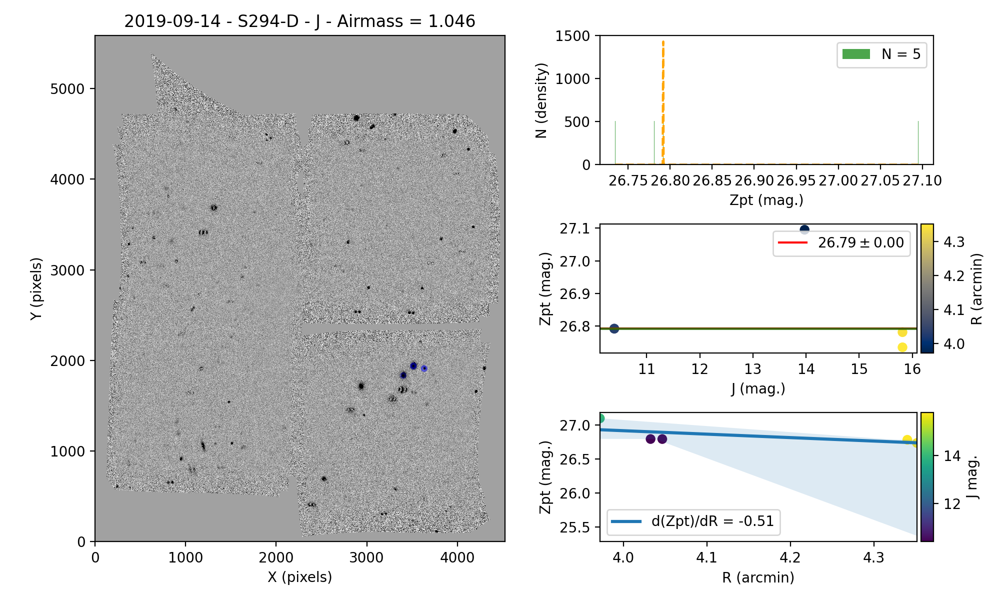

,id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,...,k_cmsig,k_snr,xcenter,ycenter,aperture_sum,annulus_median,aper_bkg,aper_sum_bkgsub,r_arcmin,zpt
0,9,3401.611612,1833.332542,0.306031,0.015468,0.161410,625.0,0.0,216.145615,13.035078,...,0.057,63.6,3401.611612,1833.332542,1.950900e+05,6.471069,18296.516824,1.767935e+05,3.972004,27.095266
1,11,3634.204322,1908.195916,0.499712,0.084794,0.018104,625.0,0.0,38.787361,2.652845,...,0.148,7.8,3634.204322,1908.195916,2.281428e+04,-0.145079,-410.201298,2.322448e+04,4.351585,26.734465
2,12,3632.391631,1913.318692,0.467294,-0.062480,0.123332,625.0,0.0,34.942139,2.410648,...,0.148,7.8,3632.391631,1913.318692,2.362294e+04,-0.218132,-616.754807,2.423970e+04,4.340106,26.780918
3,13,3514.034252,1934.157449,0.745609,0.224695,0.081945,625.0,0.0,10321.609375,740.933688,...,0.017,1290.1,3514.034252,1934.157449,3.640694e+06,6.000482,16965.964059,3.623728e+06,4.046713,26.791489
4,14,3514.141345,1943.602945,0.368184,-0.171944,-0.196356,625.0,0.0,8049.700684,893.766846,...,0.017,1290.1,3514.141345,1943.602945,3.641906e+06,5.974631,16892.870699,3.625014e+06,4.032697,26.791874


In [40]:
updated_sources = zpt.add_zpt_column(hdulist, photo, gain=1.0, show=True, sigma_clip=2.0)

updated_sources

<IPython.core.display.Javascript object>


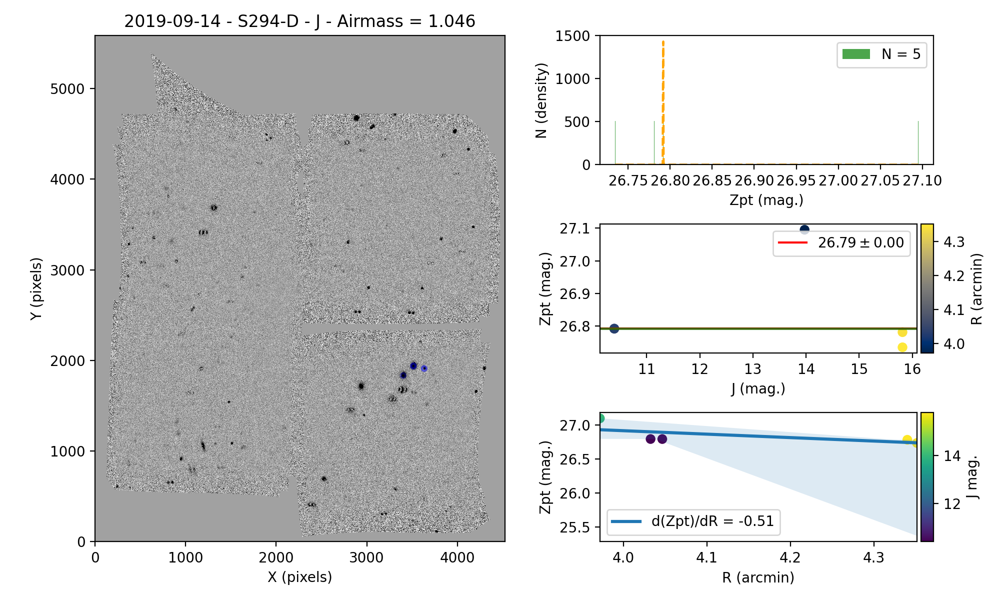

In [41]:
zpt.display_zpt_results(hdulist, photo, sigma_clip=2.0)

In [8]:
# Nuevos datos four_star
# Set 13_14, 2019


In [20]:
df

,file,object,filter,crval1,crval2,date-obs,gain,airmass,scale
0,2019-07-17_H_G93-48_c1-4_58681_21902.mos.fits,G93-48,H,328.058945,2.437661,2019-07-17,1.0,1.298,0.16
1,2019-07-17_J_G93-48_c1-4_58681_21612.mos.fits,G93-48,J,328.052441,2.411114,2019-07-17,1.0,1.309,0.16
2,2019-07-17_Ks_G93-48_c1-4_58681_22325.mos.fits,G93-48,Ks,328.059067,2.437267,2019-07-17,1.0,1.282,0.16


# 5 Run Everything at Once
---

This funciton runs the find_stars, get_two_mass_catalog, match_sources, add_zpt_column and finally the function display_zpt_results...

Optionally, one can run it for a list of input files. It will creates an figure for each input file (not implemented yet).


Good news. No saturated sources!


/Users/dsanmartim/opt/anaconda3/lib/python3.7/site-packages/astroquery/irsa/core.py:451: UserWarning: Coordinate string is being interpreted as an ICRS coordinate.
  warnings.warn("Coordinate string is being interpreted as an "
/Users/dsanmartim/PycharmProjects/four_star/four_star/tools/zpt.py:950: TableReplaceWarning: converted column 'phi_opt' from integer to float
  catalog = get_two_mass_sources(coordinates, spatial='Cone', radius=7.5 * u.arcmin)
/Users/dsanmartim/PycharmProjects/four_star/four_star/tools/zpt.py:950: TableReplaceWarning: converted column 'ext_key' from integer to float
  catalog = get_two_mass_sources(coordinates, spatial='Cone', radius=7.5 * u.arcmin)


109 2MASS Point Sources macth with sources from image.


<IPython.core.display.Javascript object>


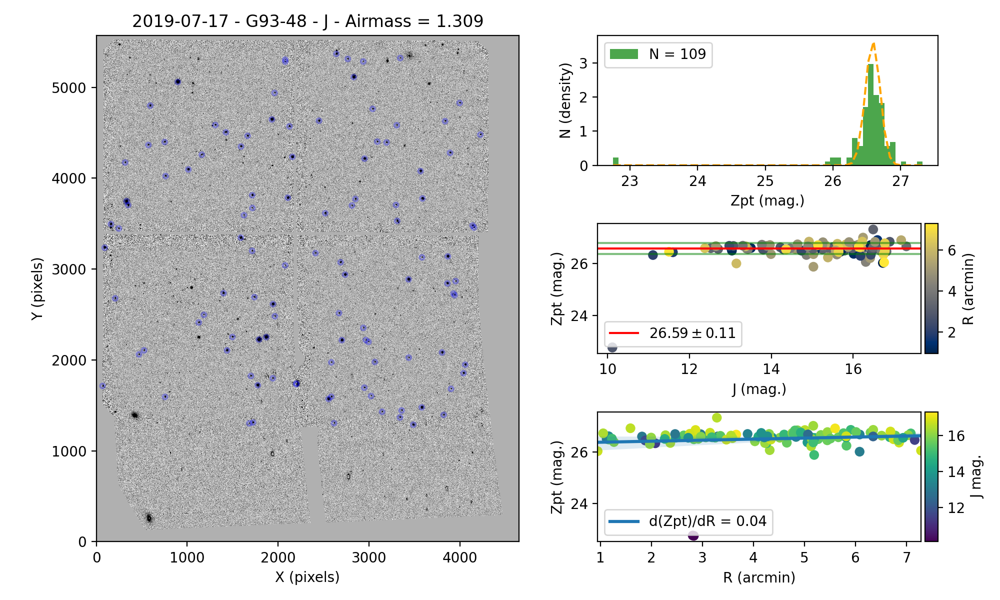

In [25]:
filename = '2019-07-17_J_G93-48_c1-4_58681_21612.mos.fits'
#filename = '2019-07-17_H_G93-48_c1-4_58681_21902.mos.fits'
#filename = '2019-07-17_Ks_G93-48_c1-4_58681_22325.mos.fits'


dataframe = zpt.run_zpt(filename, z_sigma_clip=2.0, f_round_limit=0.3)


# ToDO

1. Add log information to main functions

    
    

In [21]:
%%writefile ZPT_FSTAR_20190717.txt

# Obtained from a single star: G93-48 
2019-07-17 G93-48  J 26.61
2019-07-17 G93-48  H 26.91
2019-07-17 G93-48 Ks 26.00

# Numbers from Andy
J = 27.109±0.007    n=20 2mass stars
H = 26.832±0.008    n=20 2mass stars
Ks = 25.983±0.008   n=22 2mass stars

# Obtained from whole field
J =  26.58 +/- 0.14  N=70 2MASS stars
H =  26.87 +/- 0.07  N=87 2MASS stars
Ks = 26.02 +/- 0.12  N=92 2MASS stars

Writing ZPT_FSTAR_20190717.txt


# On how to use Sky Coordinates to match catalogs

---

==========> [SkyCoord to Match Catalogs](https://docs.astropy.org/en/stable/coordinates/matchsep.html)



In [15]:
hdulist = zpt.get_hdulist(filename)


w = zpt.get_wcs(hdulist, ext=0)

sources = fr

sources

,id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,...,designation,j_m,j_cmsig,j_snr,h_m,h_cmsig,h_snr,k_m,k_cmsig,k_snr
134,2,3494.473918,97.464452,0.500567,-0.250090,-0.112074,49.0,0.0,6127.644531,40.795156,...,b'21520019+0220402',13.992,0.028,91.3,13.453,0.032,57.9,13.394,0.038,39.7
101,4,1690.884142,111.994931,0.478828,-0.106162,-0.195139,49.0,0.0,573.193115,3.912406,...,b'21521943+0220427',16.310,0.123,8.8,16.119,0.256,4.5,15.369,NaN,NaN
99,5,2622.502654,115.071252,0.479180,-0.138797,-0.145303,49.0,0.0,793.359619,5.494763,...,b'21520950+0220427',16.036,0.086,13.9,15.457,0.117,9.1,15.914,NaN,NaN
98,7,1730.866391,121.785373,0.417773,-0.214115,-0.171795,49.0,0.0,2569.979248,17.971759,...,b'21521902+0220439',14.859,0.048,33.4,14.317,0.063,23.6,14.309,0.082,16.0
118,8,3348.042824,177.406937,0.435899,-0.237173,-0.135316,49.0,0.0,1465.736084,11.020417,...,b'21520175+0220529',15.603,0.060,20.7,14.957,0.084,14.5,14.874,0.112,10.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,250,3351.289826,4133.378446,0.430749,-0.035137,-0.010589,49.0,0.0,284.383362,2.064427,...,b'21520173+0231258',16.759,0.146,7.1,16.000,NaN,NaN,16.057,NaN,NaN
90,251,2647.939108,4178.711685,0.460225,0.206434,-0.170175,49.0,0.0,4279.892578,27.647844,...,b'21520923+0231331',14.361,0.036,65.0,13.716,0.030,45.5,13.609,0.042,32.6
159,252,3979.857986,4185.399616,0.498664,-0.140154,-0.012128,49.0,0.0,1933.913574,13.419899,...,b'21515501+0231342',15.176,0.053,30.7,14.896,0.083,15.3,14.698,0.099,12.0
138,254,3627.127322,4271.517094,0.456369,0.054313,-0.036179,49.0,0.0,1116.458618,8.192944,...,b'21515875+0231479',15.889,0.074,15.9,15.341,0.106,10.2,15.070,0.117,8.5


In [134]:
wsources = zpt.sky2world(hdulist, sources=sources, max_error=1e-6)

In [137]:
wsources = zpt.get_distance_from_center(hdulist, sources, center = None, scale = None)

In [138]:
wsources

,id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag,ra_deg,dec_deg,r_arcmin
0,1,3635.622000,94.567539,0.498293,-0.023426,0.043655,49,0.0,249.462860,1.615012,-0.520439,327.994530,2.344329,6.802917
1,2,1690.884142,111.994931,0.478828,-0.106162,-0.195139,49,0.0,573.193115,3.912406,-1.481110,328.081036,2.345105,5.712281
2,3,2622.502654,115.071252,0.479180,-0.138797,-0.145303,49,0.0,793.359619,5.494763,-1.849872,328.039596,2.345242,5.667242
3,4,673.429247,117.248362,0.411194,-0.103404,-0.055367,49,0.0,333.557312,2.571769,-1.025580,328.126294,2.345337,6.858348
4,5,3828.844547,205.830706,0.488633,-0.053668,-0.092280,49,0.0,1576.727905,11.724781,-2.672762,327.985935,2.349274,6.876440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,157,367.160153,4132.315202,0.506590,0.059711,-0.042225,49,0.0,982.069824,6.835040,-2.086853,328.139928,2.523783,7.089790
157,158,3351.289826,4133.378446,0.430749,-0.035137,-0.010589,49,0.0,284.383362,2.064427,-0.786999,328.007171,2.523832,6.026580
158,159,3979.857986,4185.399616,0.498664,-0.140154,-0.012128,49,0.0,1933.913574,13.419899,-2.819373,327.979208,2.526143,7.139830
159,160,3627.127322,4271.517094,0.456369,0.054313,-0.036179,49,0.0,1116.458618,8.192944,-2.283600,327.994899,2.529971,6.735377


In [21]:
to_correlate = ['sharpness',  'roundness1', 'roundness2', 'r_arcmin', 'mag']

dfa = wsources[to_correlate] 


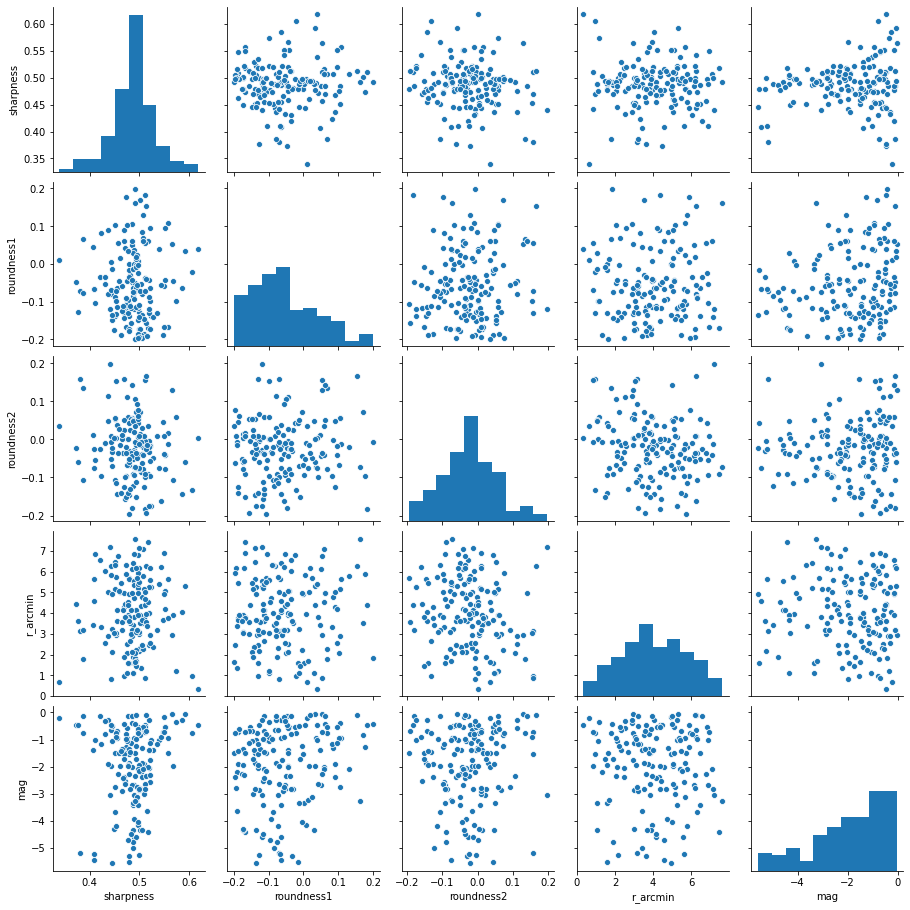

In [22]:
import seaborn as sns
%matplotlib inline
sns.pairplot(dfa, diag_kind="hist")

# Good link about constraining parameters
---

==========> https://docs.astropy.org/en/stable/modeling/example-fitting-constraints.html

In [23]:
sources

,id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag,ra_deg,dec_deg,r_arcmin
0,1,3635.622000,94.567539,0.498293,-0.023426,0.043655,49,0.0,249.462860,1.615012,-0.520439,327.994530,2.344329,6.802917
1,2,1690.884142,111.994931,0.478828,-0.106162,-0.195139,49,0.0,573.193115,3.912406,-1.481110,328.081036,2.345105,5.712281
2,3,2622.502654,115.071252,0.479180,-0.138797,-0.145303,49,0.0,793.359619,5.494763,-1.849872,328.039596,2.345242,5.667242
3,4,673.429247,117.248362,0.411194,-0.103404,-0.055367,49,0.0,333.557312,2.571769,-1.025580,328.126294,2.345337,6.858348
4,5,3828.844547,205.830706,0.488633,-0.053668,-0.092280,49,0.0,1576.727905,11.724781,-2.672762,327.985935,2.349274,6.876440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,157,367.160153,4132.315202,0.506590,0.059711,-0.042225,49,0.0,982.069824,6.835040,-2.086853,328.139928,2.523783,7.089790
157,158,3351.289826,4133.378446,0.430749,-0.035137,-0.010589,49,0.0,284.383362,2.064427,-0.786999,328.007171,2.523832,6.026580
158,159,3979.857986,4185.399616,0.498664,-0.140154,-0.012128,49,0.0,1933.913574,13.419899,-2.819373,327.979208,2.526143,7.139830
159,160,3627.127322,4271.517094,0.456369,0.054313,-0.036179,49,0.0,1116.458618,8.192944,-2.283600,327.994899,2.529971,6.735377


<IPython.core.display.Javascript object>


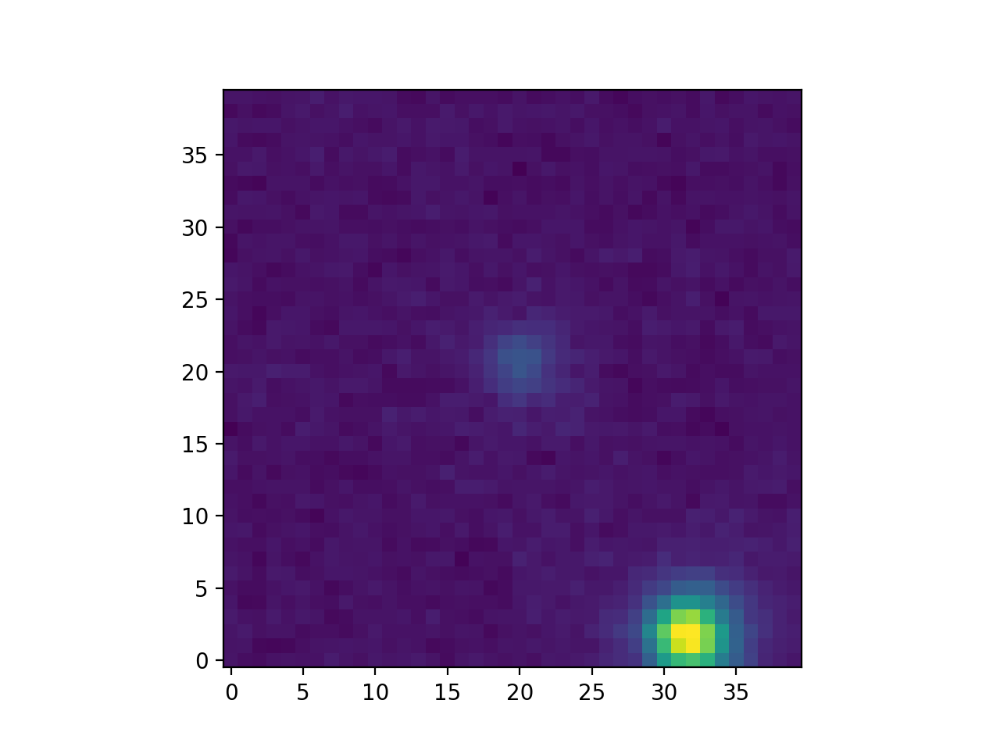

In [32]:
import matplotlib.pyplot as plt

path = working_folder

df = sources

%matplotlib notebook
hdu = zpt.get_hdulist(path+filename)
header = hdu[0].header
data = hdu[0].data 


# STAR ID

sid = 55
x, y = df.xcentroid[df.id == sid], df.ycentroid[df.id == sid]
x0, y0 = int(x.values),int(y.values)

x1, x2 = x0-20, x0+20
y1, y2 = y0-20, y0+20

sdata = data[y1:y2, x1:x2]

#eps = np.min(model_data[model_data > 0]) / 10.0
# use logarithmic scale for sharp Gaussians
plt.imshow(sdata, origin='lower', label='Gaussian') 
plt.show()


In [33]:
# Tieding up sigmax with y
def tie_sigma(model):
    return model.y_stddev


def model_data(data, g_model):

    if not isinstance(data, np.ndarray):
        raise TypeError('Please, data imput must be given as a np.array')
        
    if data.ndim is not 2:
        raise TypeError('Data contains {} dimensions while it was '
                        'expected 2 dimensions.'.format(data.ndim))
    # Getting grid
    yi, xi = np.indices(data.shape)

    # Getting model data
    model_data = g_model(xi, yi)
    
    return model_data 


def fit_2dgaussian(data, amp_init, x_init, y_init, sigma_init, tied_sigma = True):
    """
    
    circular (boolean or None)
    """
    if not isinstance(data, np.ndarray):
        raise TypeError('Please, data imput must be given as a np.array')
        
    if data.ndim is not 2:
        raise TypeError('Data contains {} dimensions while it was '
                        'expected 2 dimensions.'.format(data.ndim))

    if not isinstance(tied_sigma, (bool, type(None))):
        raise TypeError('Please, circular muste be a bool or None type.')
    
    # Gettin initial guess from model
    g_init = models.Gaussian2D(amp_init, x_init, y_init, sigma_init, sigma_init)

    # Circular os Elliptical Gaussian
    if tied_sigma:
        g_init.x_stddev.tied = tie_sigma

    # Getting grid
    yi, xi = np.indices(data.shape)

    # Fitting 
    fit_g = fitting.LevMarLSQFitter()
    g = fit_g(g_init, xi, yi, data)
    
    return g


def fit_2dSersic(data, amp, r_eff, n, x, y, ellip, theta):
    
    if not isinstance(data, np.ndarray):
        raise TypeError('Please, data imput must be given as a np.array')
        
    if data.ndim is not 2:
        raise TypeError('Data contains {} dimensions while it was '
                        'expected 2 dimensions.'.format(data.ndim))
        
    # Gettin initial guess from model
    s_init = models.Sersic2D(amp, r_eff, n, x, y, ellip, theta)

    # Getting grid
    yi,xi = np.meshgrid(np.arange(data.shape[0]), np.arange(data.shape[1]))

    # Fitting 
    fit_s = fitting.LevMarLSQFitter()
    s = fit_s(s_init, xi, yi, data)

    return s


def fit_gaussians(sources, data, tied_sigma = True):
    
    pass

In [347]:
# Testing gaussian fitting

%matplotlib notebook
import astropy.io.fits as fits
import os
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.patches import Ellipse

# Normalizing data
data = sdata / np.max(sdata)

# Getting Initial values
sigma = 2.0                   # in pixels

# Getting amp from data frame
amp = df.peak[df.id == sid]
amp_init = np.float(amp) / np.max(sdata)

# Changing origing of the reference system
x_init, y_init = x0 - x1, y0 - y1

# Gaussian model
g = fit_2dgaussian(data, amp_init, x_init, y_init, sigma, tied_sigma=False)

# Sersic model
#g = fit_2dSersic(data, amp=0.1*amp_init, r_eff=sigma, n=1, x=x_init, y=y_init, ellip=0.4, theta=0.1)
mdata = model_data(data, g)
log_img = np.log10(mdata)

fig, ax = plt.subplots()

ax.imshow(data, origin='lower', interpolation='nearest') 

#ax.imshow(log_img, origin='lower', interpolation='nearest') 

ax.imshow(mdata, label='Gaussian', origin='lower') 
circle = Circle((g.x_mean.value, g.y_mean.value),
                 g.x_fwhm, facecolor ='None',
                 edgecolor = 'red', linewidth = 1)

theta = g.theta * (180/np.pi)

ellipse = Ellipse((g.x_mean.value, g.y_mean.value),
                   2 * g.x_fwhm, 2 * g.y_fwhm, angle=theta, facecolor ='None',
                   edgecolor = 'red', linewidth = 1)

#circle_reff = Circle((g.x_0.value, g.y_0.value),
#                 g.r_eff, facecolor ='None',
#                 edgecolor = 'red', linewidth = 1)


ax.add_patch(circle)
#ax.add_patch(ellipse)
#ax.add_patch(circle_reff)

plt.show()

NameError: name 'sdata' is not defined

In [39]:
g

<Gaussian2D(amplitude=0.21328328, x_mean=20.20757936, y_mean=20.54663152, x_stddev=2.02242557, y_stddev=2.09677232, theta=0.69059264)>

In [687]:
#g.amplitude * np.max(sdata)

seeing = g.x_fwhm*header['scale']

g

AttributeError: 'Sersic2D' object has no attribute 'x_fwhm'

In [614]:
g.x_fwhm, g.y_fwhm

#help(w.wcs_world2pix)

g.x_fwhm/g.y_fwhm

1.0

In [615]:
df.loc[df['id'] ==  sid]

,id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
95,96,3948.693654,1522.664052,0.460746,0.016376,-0.015849,49,0.0,851.943665,6.219978,-1.984472
